In [1]:
from google.cloud import vision

In [8]:
from PIL import Image
from mtcnn.mtcnn import MTCNN
import numpy as np

# Dummy function to simulate DeepFace.analyze
def deepface_analyze(image_np):
    return {"age": 25}

# Function to preprocess image and detect face & age
def agepredictor(image_name):
    # Open image using PIL
    image_pil = Image.open(image_name)
    
    # Convert PIL Image to numpy array
    image_np = np.array(image_pil)
    
    # Initialize MTCNN
    detector = MTCNN()
    
    # Detect faces
    results = detector.detect_faces(image_np)
    
    if results:
        # Assuming the first detected face is the one you're interested in
        x, y, w, h = results[0]['box']
        
        # Crop the face area
        face_image = image_np[y:y+h, x:x+w]
        
        # Predict age (In your case, it could be a DeepFace call)
        age = deepface_analyze(face_image)['age']
        
        return age, (x, y, w, h)
    
# Function to preprocess image and detect face & age
def agepredictor(image_name):
    # Initialize Google Vision client
    client = vision.ImageAnnotatorClient.from_service_account_json("credentials.json")
    # client = vision.ImageAnnotatorClient()

    # Open image using PIL
    image_pil = Image.open(image_name)

    # Convert PIL Image to numpy array
    image_np = np.array(image_pil)

    # Load image to Google Vision API
    with open(image_name, "rb") as image_file:
        content = image_file.read()
    image = vision.Image(content=content)

    # Detect faces
    response = client.face_detection(image=image)
    face_annotations = response.face_annotations

    if face_annotations:
        # Assuming the first detected face is the one you're interested in
        x, y, w, h = (face_annotations[0].bounding_poly.vertices[0].x, face_annotations[0].bounding_poly.vertices[0].y,
                      face_annotations[0].bounding_poly.vertices[2].x - face_annotations[0].bounding_poly.vertices[0].x,
                      face_annotations[0].bounding_poly.vertices[2].y - face_annotations[0].bounding_poly.vertices[0].y)

        # Crop the face area
        face_image = image_np[y:y + h, x:x + w]

        # Predict age (In your case, it could be a DeepFace call)
        age = deepface_analyze(face_image)['age']

        return age, (x, y, w, h)

In [4]:
from PIL import Image
import numpy as np
from glob import glob

images = glob("u*/*g")
# images

In [5]:
im = Image.open(images[0])
image_np = np.array(im)

In [11]:
# Test the function
age, coords = agepredictor(images[0])
print(f"Predicted Age: {age}, Coordinates: {coords}")

Predicted Age: 25, Coordinates: (1230, 0, 3122, 3527)


In [12]:
x, y, w, h = coords

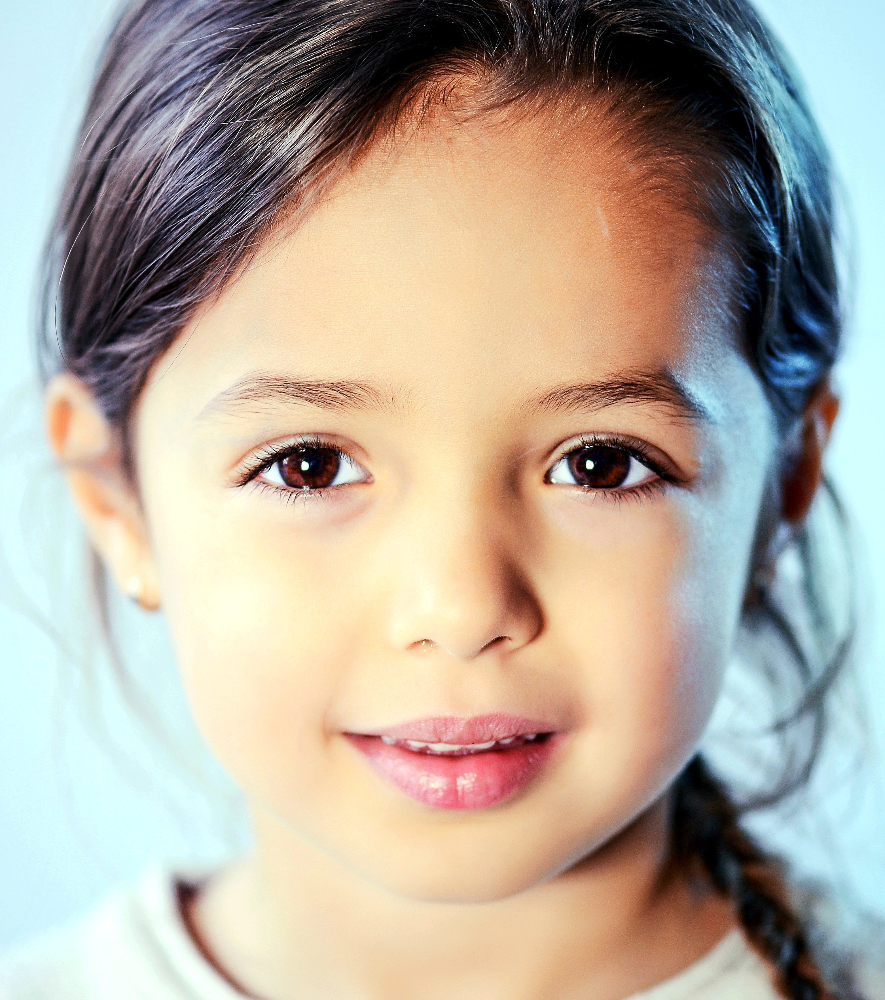

In [13]:
Image.fromarray(image_np[y:y+h, x:x+w])